In [ ]:
##Importing all required packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [69]:
#Reading Data

In [82]:
uber_15 = pd.read_csv(os.path.expanduser('~/Data Projects/Uber New York Data Analysis/Uber NY Data/uber-raw-data-janjune-15.csv'), encoding = 'utf-8')

In [93]:
#Checking and Cleaning

In [87]:
uber_15.head(2)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65


In [86]:
uber_15.shape

(14270479, 4)

In [88]:
uber_15.duplicated().sum()

898225

In [90]:
uber_15.drop_duplicates(inplace = True)

In [91]:
uber_15.shape

(13372254, 4)

In [92]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [103]:
#Convert Data Types and Extract

In [100]:
df15 = uber_15.copy()
df15['Pickup_date'] = pd.to_datetime(df15['Pickup_date'], format = '%Y-%m-%d %H:%M:%S')
df15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [102]:
df15['month'] = df15['Pickup_date'].dt.month

<AxesSubplot:title={'center':'Month With Max Pickups'}>

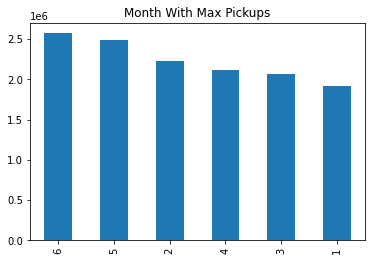

In [111]:
#Bar Graph to depict months with most Pickups

df15['month'].value_counts().plot(kind = 'bar', title = 'Month With Max Pickups')

In [112]:
#Analysis of Uber Trips - Total Trips for each month and weekdays

In [114]:
df15['weekday'] = df15['Pickup_date'].dt.day_name()
df15['day'] = df15['Pickup_date'].dt.day
df15['hour'] = df15['Pickup_date'].dt.hour
df15['minute'] = df15['Pickup_date'].dt.minute
df15.head(5)

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,month,weekday,day,hour,minute
0,B02617,2015-05-17 09:47:00,B02617,141,5,Sunday,17,9,47
1,B02617,2015-05-17 09:47:00,B02617,65,5,Sunday,17,9,47
2,B02617,2015-05-17 09:47:00,B02617,100,5,Sunday,17,9,47
3,B02617,2015-05-17 09:47:00,B02774,80,5,Sunday,17,9,47
4,B02617,2015-05-17 09:47:00,B02617,90,5,Sunday,17,9,47


In [116]:
tempdf15 = df15.groupby(['month', 'weekday'], as_index = False).size()
tempdf15.head()

,month,weekday,size
0,1,Friday,339285
1,1,Monday,190606
2,1,Saturday,386049
3,1,Sunday,230487
4,1,Thursday,330319


In [117]:
tempdf15['month'].unique()

array([1, 2, 3, 4, 5, 6])

In [119]:
dict_month = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun'}
tempdf15['month'] = tempdf15['month'].map(dict_month)
tempdf15

,month,weekday,size
0,Jan,Friday,339285
1,Jan,Monday,190606
2,Jan,Saturday,386049
3,Jan,Sunday,230487
4,Jan,Thursday,330319
5,Jan,Tuesday,196574
6,Jan,Wednesday,245650
7,Feb,Friday,373550
8,Feb,Monday,274948
9,Feb,Saturday,368311


[Text(0.5, 1.0, 'Total Trips For Each Mopnth and Weekday')]

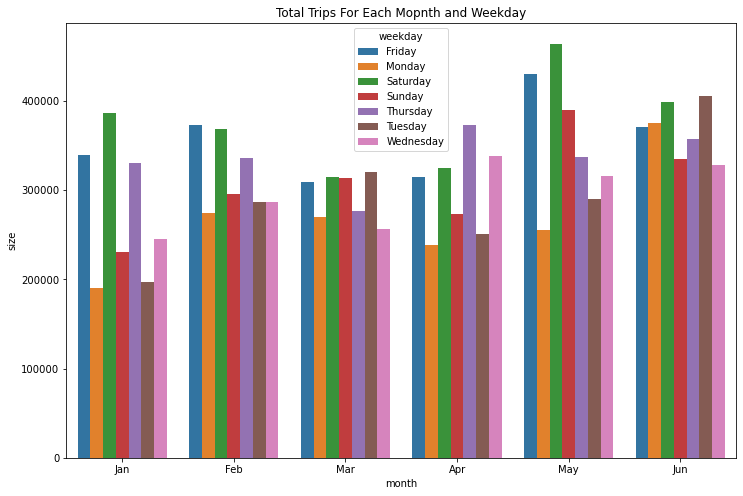

In [126]:
plt.figure(figsize = (12, 8))
sns.barplot(x = 'month', y = 'size', hue = 'weekday', data = tempdf15).set(title = 'Total Trips For Each Mopnth and Weekday')

#By identifying these, we can identify peaks and other useful information

In [127]:
#Analysing Hourly Demand of Uber in New York

In [131]:
summary15 = df15.groupby(['weekday', 'hour'], as_index = False).size()

In [133]:
summary15.head()

,weekday,hour,size
0,Friday,0,79879
1,Friday,1,44563
2,Friday,2,27252
3,Friday,3,19076
4,Friday,4,23049


[Text(0.5, 0, 'Hour'), Text(0, 0.5, 'Trips'), Text(0.5, 1.0, 'Hourly Demand')]

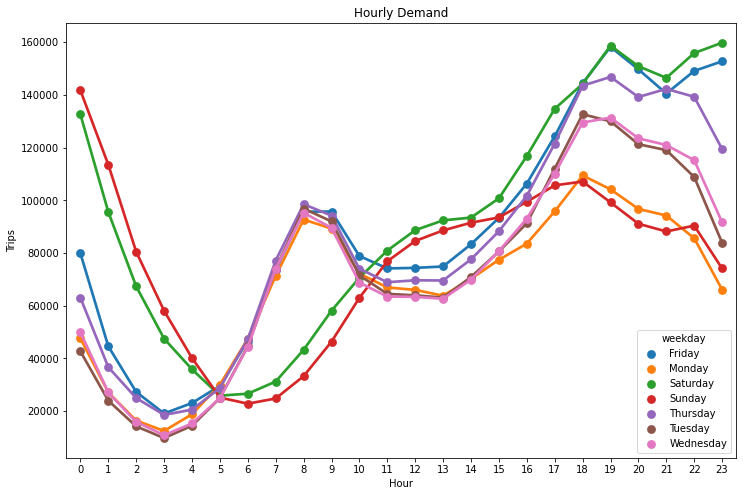

In [138]:
plt.figure(figsize = (12, 8))
sns.pointplot(x = 'hour', y = 'size', hue = 'weekday', data = summary15).set(xlabel = 'Hour', ylabel = 'Trips', title = 'Hourly Demand')

#Now we can identify trends by hour and weekday

In [142]:
#Analizing most active Uber Vehicle Base-number 
#Find the distribution of active vehicles per base number

In [140]:
uber_foil = pd.read_csv(os.path.expanduser('~/Data Projects/Uber New York Data Analysis/Uber NY Data/Uber-Jan-Feb-FOIL.csv'), encoding = 'utf-8')

In [141]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [143]:
!pip install chart_studio
!pip install plotly

     |████████████████████████████████| 64 kB 1.9 MB/s eta 0:00:01
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11447 sha256=156b1d327f9beeb9f19ba6ca045383065ce7ddcf301ac1fedb871e6f714ff58c
  Stored in directory: /Users/ianm/Library/Caches/pip/wheels/ce/18/7f/e9527e3e66db1456194ac7f61eb3211068c409edceecff2d31
Successfully built retrying


In [144]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import download_plotlyjs, plot, iplot, init_notebook_mode
init_notebook_mode(connected = True)

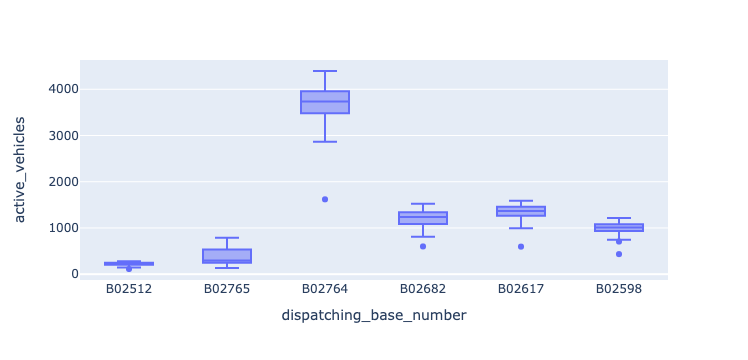

In [145]:
px.box(x = 'dispatching_base_number', y = 'active_vehicles', data_frame = uber_foil)

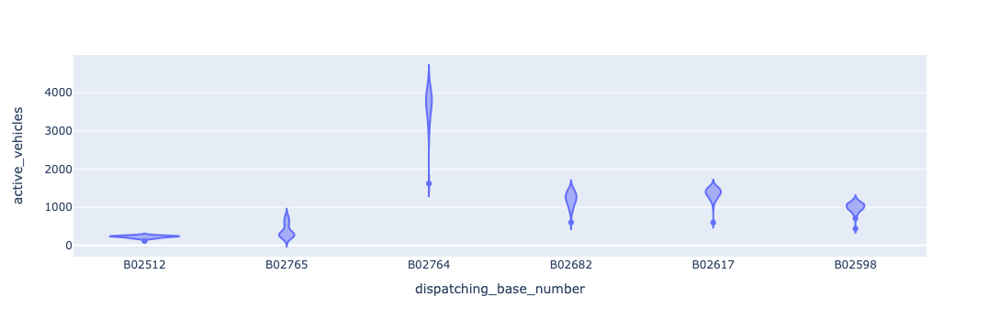

In [147]:
px.violin(x = 'dispatching_base_number', y = 'active_vehicles', data_frame = uber_foil)

#See the distribution better

In [149]:
#Collecting Entire Data and Make It Ready

In [94]:
prefiles = os.listdir(os.path.expanduser('~/Data Projects/Uber New York Data Analysis/Uber NY Data'))
prefiles.sort()
files = prefiles[-7:]
files.remove('uber-raw-data-janjune-15.csv')
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [50]:
path = os.path.expanduser('~/Data Projects/Uber New York Data Analysis/Uber NY Data')

final = pd.DataFrame()

for file in files:
    df = pd.read_csv(path + '/' + file, encoding = 'utf-8')
    final = pd.concat([final, df])

In [51]:
final.shape

(4534327, 4)

In [52]:
df = final.copy()
df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [53]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [63]:
df['Date/Time'] = pd.to_datetime(df['Date/Time'], format = '%m/%d/%Y %H:%M:%S')
df.head()

,Date/Time,Lat,Lon,Base
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512


In [64]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [65]:
final.shape

(4534327, 4)

In [66]:
final.duplicated().sum()

82581

In [67]:
final.drop_duplicates(inplace = True)

In [68]:
final.shape

(4451746, 4)

In [154]:
df.duplicated().sum()

82581

In [155]:
df.drop_duplicates(inplace = True)

In [156]:
df.shape

(4451746, 4)

In [157]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [151]:
#Spatial Analysis to find rush of Uber Pickups (Heatmap)

In [160]:
rush_uber = df.groupby(['Lat', 'Lon'], as_index = False).size()
rush_uber

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,1


In [162]:
!pip install folium

     |████████████████████████████████| 95 kB 2.3 MB/s eta 0:00:011


In [163]:
import folium

In [165]:
basemap = folium.Map()

In [166]:
from folium.plugins import HeatMap as HM

In [169]:
HM(rush_uber).add_to(basemap)

In [171]:
basemap

#This is the HeatMap showing locations where it's most used, zoom in for detailed view per area

In [173]:
#Examine Rush on Hour and Weekday (Pivot Table)

In [174]:
df['Date/Time'] = pd.to_datetime(df['Date/Time'], format = '%m-%d-%Y %H:%M:%S')

In [175]:
df['weekday'] = df['Date/Time'].dt.day
df['hour'] = df['Date/Time'].dt.hour
df.head()

,Date/Time,Lat,Lon,Base,weekday,hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,0


In [176]:
pivot = df.groupby(['weekday', 'hour']).size().unstack()

In [177]:
type(df.groupby(['weekday', 'hour']).size())

pandas.core.series.Series

In [178]:
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,...,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,...,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,...,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,...,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,...,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,...,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,...,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,...,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,...,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203


In [180]:
pivot.style.background_gradient()

#Now we can visualize by comparizon which days and which hours have surges.

hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,,,,
1,3178,1944,1256,1308,1429,2126,3664,5380,5292,4617,4607,4729,4930,5794,6933,7910,8633,9511,8604,8001,7315,7803,6268,4050
2,2435,1569,1087,1414,1876,2812,4920,6544,6310,4712,4797,4975,5188,5695,6904,8449,10109,11100,11123,9474,8759,8357,6998,5160
3,3354,2142,1407,1467,1550,2387,4241,5663,5386,4657,4788,5065,5384,6093,7226,8850,10314,10491,11239,9599,9026,8531,7142,4686
4,2897,1688,1199,1424,1696,2581,4592,6029,5704,4744,4743,4975,5193,6175,7158,8515,9492,10357,10259,9097,8358,8649,7706,5130
5,2733,1541,1030,1253,1617,2900,4814,6261,6469,5530,5141,5011,5047,5690,6955,8312,9609,10699,10170,9430,9354,9610,8853,6518
6,4537,2864,1864,1555,1551,2162,3642,4766,4942,4401,4801,5174,5426,6258,7235,8612,9444,9929,9263,8405,8117,8567,7852,5946
7,3645,2296,1507,1597,1763,2422,4102,5575,5376,4639,4905,5166,5364,6214,7276,8474,10393,11013,10573,9472,8691,8525,7194,4801
8,2830,1646,1123,1483,1889,3224,5431,7361,7357,5703,5288,5350,5483,6318,7240,8775,9851,10673,9687,8796,8604,8367,6795,4256
9,2657,1724,1222,1480,1871,3168,5802,7592,7519,5895,5406,5443,5496,6419,7877,9220,10270,11910,11449,9804,8909,8665,7499,5203
